<a href="https://colab.research.google.com/github/JuanS286/gif_auto_audio_description/blob/test/Capstone_Research_WhatheGif_Ganesh_Feature_Extraction_and_Notebook.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Capstone Research - What the gif

**Note to reader**

This notebook contains a 'general idea':
- Notes on how types of feature in Gifs and Undertanding Dataset
- How to load a tsv file using a DASK Framework since we had 125000 rows(Research Ongoing but you can use pandas)
- Short Description and Interactive Widget to display keywords
- WordCloud Showing GIF Description Trend
- How to load a gif from a url and extract frame
- How to load from a pretrained model YOLO3 for object detection (didnt work well, detected a cake instead of a phone, need to do more testing and play with parameters)

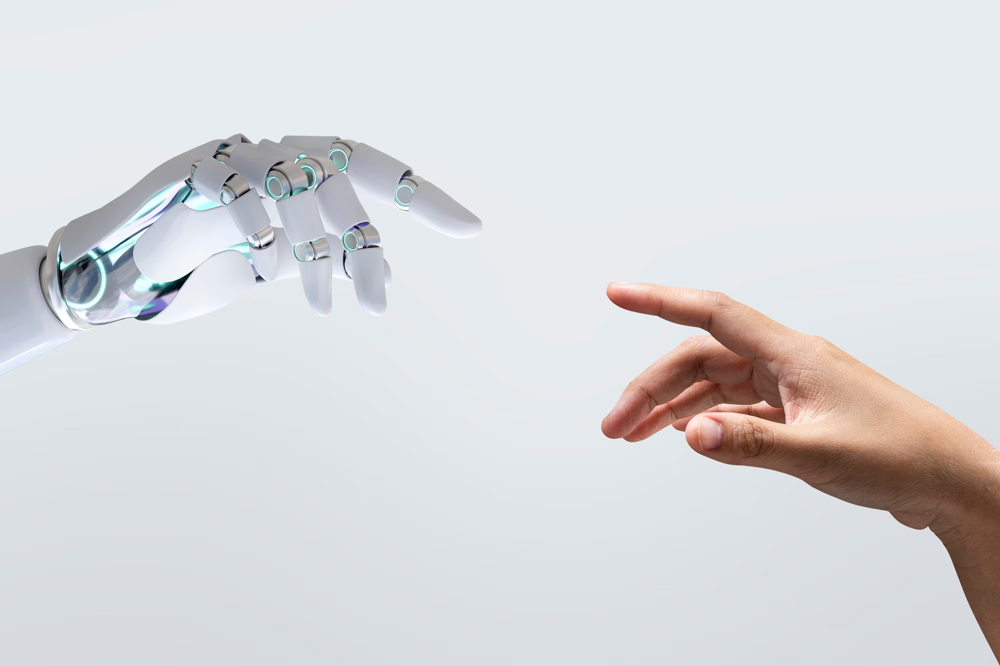

# Showcasing and Extracting Features of GIFs for Model Design

Since this is an identification problem rather than classification, the focus shifts to extracting features that can effectively describe the content and dynamics of a GIF. Here are some key features you can extract and visualize to enhance the understanding of GIFs:

### 1. **Visual Content Features:**
   - **Object Detection and Recognition:** Use pre-trained object detection models like YOLO or Faster R-CNN to identify and localize objects in each frame. The goal is to recognize what is present in the GIF (e.g., people, animals, vehicles). This can help in understanding the scene context and primary actors in the GIF.
   - **Scene Recognition:** Apply scene recognition models (e.g., Places365) to identify the environment or setting of the GIF, such as "beach," "city," or "kitchen." This provides context for the GIF and helps form the basis of the description.
   - **Facial Recognition and Expression Analysis:** If the GIFs involve human faces, extract features related to facial expressions and emotions. This can involve identifying facial landmarks and analyzing changes across frames to capture expressions like "smiling," "surprised," or "angry."

### 2. **Temporal Features (Motion and Dynamics):**
   - **Optical Flow:** Calculate the optical flow between consecutive frames to capture the motion dynamics. Optical flow vectors describe the direction and speed of movement, helping to identify actions (e.g., "running," "jumping"). These features are crucial for describing what is happening in the GIF.
   - **Trajectory and Motion Patterns:** Track the movement of key objects or persons over time. This can involve using keypoint tracking to follow the motion path of an object (e.g., "a ball moving across the screen"). It helps in identifying complex actions or interactions within the GIF.
   - **Speed and Direction:** Analyze the speed and direction of moving objects. This can indicate the nature of the action, such as "quickly running" versus "slowly walking."

### 3. **Texture and Appearance Features:**
   - **Texture Descriptors (e.g., LBP):** Extract texture features like Local Binary Patterns (LBP) from key frames to capture surface patterns. This can be useful for identifying repetitive textures or distinguishing between different surface types (e.g., "rough road," "smooth water").
   - **Color Histograms:** Analyze the color distribution in key frames. This helps identify dominant colors or color changes over time, providing visual cues like "colorful fireworks" or "dark and gloomy scene."

### 4. **Scene Dynamics and Events:**
   - **Action Recognition:** Use action recognition models (e.g., C3D, I3D) to detect common actions in the GIF. These models can recognize complex actions like "dancing," "playing sports," or "cooking," providing a high-level summary of the GIF's content.
   - **Event Detection:** Detect specific events by analyzing changes in the scene or interactions between objects. For example, an event like "a cat knocking over a glass" involves recognizing both the cat's motion and the glass's change in state.

### 5. **Salient Regions and Key Moments:**
   - **Saliency Maps:** Generate saliency maps to identify the most visually important regions in each frame. This helps highlight where the viewer's attention is likely to be drawn, indicating the primary focus of the GIF.
   - **Key Frame Identification:** Select key frames that represent significant moments in the GIF. This can be based on changes in motion, appearance, or the occurrence of key events, providing a visual summary of the GIF's content.

### 6. **Audio Features (if Applicable):**
   - **Audio Cues:** If the GIF contains audio, extract features like Mel-frequency cepstral coefficients (MFCCs) or audio event recognition to identify sounds or speech that accompany the visuals. Audio cues can significantly enhance the description by providing additional context.

### 7. **Semantic and Contextual Features:**
   - **Semantic Segmentation:** Use semantic segmentation to label each pixel in the frame with a category (e.g., "person," "sky," "tree"). This helps in understanding the spatial arrangement and context of objects within the scene.
   - **Contextual Relationships:** Analyze relationships between detected objects and their actions. For example, recognizing "a person holding an umbrella in the rain" involves understanding the spatial and functional relationship between the person, the umbrella, and the rain.

By extracting these features, we can provide a detailed representation of both the static and dynamic aspects of the GIFs. This set of features aims to capture the "who," "what," "where," and "how" of the content, making it easier to generate descriptive and informative text for visually impaired users.

# 1.0 Using Dask instead of Pandas to load the dataset

Dask to handle the large TSV file and then sample a smaller subset of 100 GIFs for further processing.

We will be running trials on execution time as well

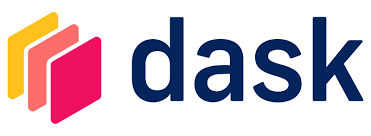

In [6]:
pip install dask


In [7]:
import time
import dask.dataframe as dd
from google.colab import drive

# Step 1: Mount Google Drive (if the file is stored in Google Drive)
drive.mount('/content/drive')

# Step 2: Start the timer
start_time = time.time()

# Step 3: Load the TSV file using Dask
tsv_file_path = '/content/tgif-v1.0 (2).tsv'
data = dd.read_csv(tsv_file_path, sep='\t')

# Step 4: Sample 100 random records
sample_data = data.sample(frac=100/data.shape[0].compute(), random_state=42).compute()

# Step 5: Stop the timer
end_time = time.time()
execution_time = end_time - start_time

# Display the sample and execution time
print(sample_data.head())
print(f"Execution Time: {execution_time:.2f} seconds")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
      https://38.media.tumblr.com/9f6c25cc350f12aa74a7dc386a5c4985/tumblr_mevmyaKtDf1rgvhr8o1_500.gif  \
72003  https://38.media.tumblr.com/7fef21b52520305e17...                                                
39134  https://33.media.tumblr.com/cc1a998608769d4b30...                                                
4888   https://31.media.tumblr.com/04f2ca2031913c11da...                                                
60701  https://38.media.tumblr.com/02e34187f49a1f86d0...                                                
89484  https://38.media.tumblr.com/79098b58001568841c...                                                

      a man is glaring, and someone with sunglasses appears.  
72003  a person is riding a bike down a street and tu...      
39134            a cat is rubbing its face on something.      
4888         the woman is turning her head while sm

In [ ]:
print(sample_data.columns)

Index(['https://38.media.tumblr.com/9f6c25cc350f12aa74a7dc386a5c4985/tumblr_mevmyaKtDf1rgvhr8o1_500.gif', 'a man is glaring, and someone with sunglasses appears.'], dtype='object')


In [21]:
print(sample_data.columns)

Index(['https://38.media.tumblr.com/9f6c25cc350f12aa74a7dc386a5c4985/tumblr_mevmyaKtDf1rgvhr8o1_500.gif', 'a man is glaring, and someone with sunglasses appears.'], dtype='object')


[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Execution Time: 0.93 seconds


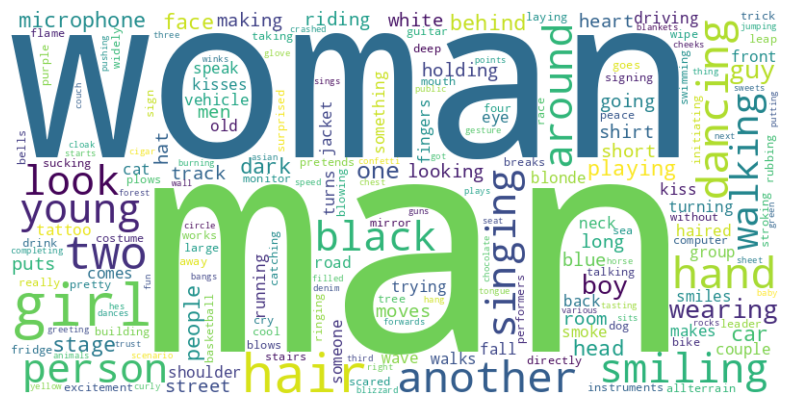

Top 10 Keywords:
['another' 'around' 'dancing' 'girl' 'hair' 'man' 'smiling' 'two' 'woman'
 'young']
Most Common Words:
[('man', 39), ('woman', 20), ('girl', 13), ('hair', 12), ('two', 9), ('another', 8), ('dancing', 8), ('person', 7), ('smiling', 7), ('young', 7)]


In [ ]:
import time
import dask.dataframe as dd
from google.colab import drive
import pandas as pd
import matplotlib.pyplot as plt
from wordcloud import WordCloud
from sklearn.feature_extraction.text import TfidfVectorizer
import nltk
from nltk.corpus import stopwords
import re
from collections import Counter

# Download NLTK data (only needs to be run once)
nltk.download('punkt')
nltk.download('stopwords')

# Step 1: Mount Google Drive (if the file is stored in Google Drive)
drive.mount('/content/drive')

# Step 2: Start the timer
start_time = time.time()

# Step 3: Load the TSV file using Dask
tsv_file_path = '/content/tgif-v1.0 (2).tsv'
data = dd.read_csv(tsv_file_path, sep='\t')

# Step 4: Sample 100 random records
sample_data = data.sample(frac=100/data.shape[0].compute(), random_state=42).compute()

# Step 5: Stop the timer
end_time = time.time()
execution_time = end_time - start_time

# Display execution time
print(f"Execution Time: {execution_time:.2f} seconds")

# Step 6: Text preprocessing
stop_words = set(stopwords.words('english'))

def clean_text(text):
    # Remove non-alphabetic characters and lowercase
    text = re.sub(r'[^a-zA-Z\s]', '', text).lower()
    # Tokenize the text
    tokens = nltk.word_tokenize(text)
    # Remove stopwords and return clean text
    return ' '.join([word for word in tokens if word not in stop_words])

# Apply text cleaning to descriptions
sample_data['cleaned_caption'] = sample_data[sample_data.columns[1]].apply(clean_text)

# Step 7: Generate word cloud
all_text = ' '.join(sample_data['cleaned_caption'].values)
wordcloud = WordCloud(width=800, height=400, background_color='white').generate(all_text)

# Display the word cloud
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

# Step 8: Extract keywords using TF-IDF
vectorizer = TfidfVectorizer(max_features=10)
tfidf_matrix = vectorizer.fit_transform(sample_data['cleaned_caption'].values)
keywords = vectorizer.get_feature_names_out()

print("Top 10 Keywords:")
print(keywords)

# Step 9: Most common words (optional)
word_counts = Counter(all_text.split())
common_words = word_counts.most_common(10)

print("Most Common Words:")
print(common_words)





[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Execution Time: 1.30 seconds


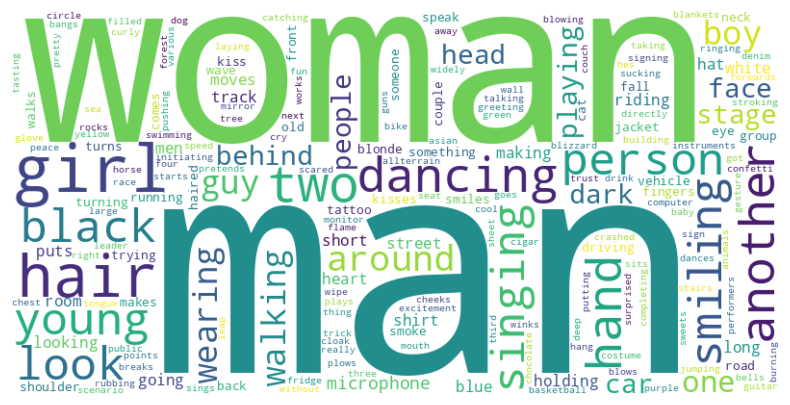

Top 10 Keywords:
['another' 'around' 'dancing' 'girl' 'hair' 'man' 'smiling' 'two' 'woman'
 'young']
Most Common Words:
[('man', 39), ('woman', 20), ('girl', 13), ('hair', 12), ('two', 9), ('another', 8), ('dancing', 8), ('person', 7), ('smiling', 7), ('young', 7)]


interactive(children=(IntSlider(value=10, continuous_update=False, description='Number of Keywords:', max=20, …

In [24]:
import time
import dask.dataframe as dd
from google.colab import drive
import pandas as pd
import matplotlib.pyplot as plt
from wordcloud import WordCloud
from sklearn.feature_extraction.text import TfidfVectorizer
import nltk
from nltk.corpus import stopwords
import re
from collections import Counter
# Import the widgets module
import ipywidgets as widgets

# Download NLTK data (only needs to be run once)
nltk.download('punkt')
nltk.download('stopwords')

# Step 1: Mount Google Drive (if the file is stored in Google Drive)
drive.mount('/content/drive')

# Step 2: Start the timer
start_time = time.time()

# Step 3: Load the TSV file using Dask
tsv_file_path = '/content/tgif-v1.0 (2).tsv'
data = dd.read_csv(tsv_file_path, sep='\t')

# Step 4: Sample 100 random records
sample_data = data.sample(frac=100/data.shape[0].compute(), random_state=42).compute()

# Step 5: Stop the timer
end_time = time.time()
execution_time = end_time - start_time

# Display execution time
print(f"Execution Time: {execution_time:.2f} seconds")

# Step 6: Text preprocessing
stop_words = set(stopwords.words('english'))

def clean_text(text):
    # Remove non-alphabetic characters and lowercase
    text = re.sub(r'[^a-zA-Z\s]', '', text).lower()
    # Tokenize the text
    tokens = nltk.word_tokenize(text)
    # Remove stopwords and return clean text
    return ' '.join([word for word in tokens if word not in stop_words])

# Apply text cleaning to descriptions
sample_data['cleaned_caption'] = sample_data[sample_data.columns[1]].apply(clean_text)

# Step 7: Generate word cloud
all_text = ' '.join(sample_data['cleaned_caption'].values)
wordcloud = WordCloud(width=800, height=400, background_color='white').generate(all_text)

# Display the word cloud
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

# Step 8: Extract keywords using TF-IDF
vectorizer = TfidfVectorizer(max_features=10)
tfidf_matrix = vectorizer.fit_transform(sample_data['cleaned_caption'].values)
keywords = vectorizer.get_feature_names_out()

print("Top 10 Keywords:")
print(keywords)

# Step 9: Most common words (optional)
word_counts = Counter(all_text.split())
common_words = word_counts.most_common(10)

print("Most Common Words:")
print(common_words)

def display_keywords(num_keywords):
  vectorizer = TfidfVectorizer(max_features=num_keywords)
  tfidf_matrix = vectorizer.fit_transform(sample_data[sample_data.columns[1]].values)
  keywords = vectorizer.get_feature_names_out()

  print("Top Keywords:")
  print(keywords)

num_keywords_slider = widgets.IntSlider(
    value=10,
    min=1,
    max=20,
    step=1,
    description='Number of Keywords:',
    continuous_update=False
)

widgets.interactive(display_keywords, num_keywords=num_keywords_slider)

# Load Image from url

In [8]:
from IPython.display import Image, display

# Direct image URL from Giphy (replace with the actual direct link to the .gif file)
gif_url = "https://media.giphy.com/media/lW0WK1LbUKI6EPhWoR/giphy.gif"
display(Image(url=gif_url))



To perform visual content features extraction like object detection, scene recognition, and facial recognition on the GIF, you'll need to use pre-trained models available through libraries like OpenCV, TensorFlow, PyTorch, and others.



In [ ]:
!pip install opencv-python-headless
!pip install torch torchvision
!pip install facenet-pytorch
!pip install imageio


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.9/1.9 MB 24.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.5/4.5 MB 61.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 755.5/755.5 MB 860.2 kB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 410.6/410.6 MB 3.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 14.1/14.1 MB 59.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 23.7/23.7 MB 55.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 823.6/823.6 kB 40.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 731.7/731.7 MB 1.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 121.6/121.6 MB 7.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.5/56.5 MB 13.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 124.2/124.2 MB 7.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 196.0/196.0 MB 4.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16

### 1. **Visual Content Features:**
   - **Object Detection and Recognition:** Use pre-trained object detection models like YOLO or Faster R-CNN to identify and localize objects in each frame. The goal is to recognize what is present in the GIF (e.g., people, animals, vehicles). This can help in understanding the scene context and primary actors in the GIF.

In [10]:
#Download YOLO Weights and Config Files:
!wget https://pjreddie.com/media/files/yolov3.weights
!wget https://raw.githubusercontent.com/pjreddie/darknet/master/cfg/yolov3.cfg
!wget https://raw.githubusercontent.com/pjreddie/darknet/master/data/coco.names


--2024-09-28 01:01:20--  https://pjreddie.com/media/files/yolov3.weights
Resolving pjreddie.com (pjreddie.com)... 162.0.215.52
Connecting to pjreddie.com (pjreddie.com)|162.0.215.52|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 248007048 (237M) [application/octet-stream]
Saving to: ‘yolov3.weights’

yolov3.weights      100%[===================>] 236.52M  16.0MB/s    in 13s     

2024-09-28 01:01:34 (18.4 MB/s) - ‘yolov3.weights’ saved [248007048/248007048]

--2024-09-28 01:01:34--  https://raw.githubusercontent.com/pjreddie/darknet/master/cfg/yolov3.cfg
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.111.133, 185.199.109.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 8342 (8.1K) [text/plain]
Saving to: ‘yolov3.cfg’

yolov3.cfg          100%[===================>]   8.15K  --.-KB/s    in 0s      

2

In [19]:
# YOLO
import imageio
import cv2
import numpy as np
from PIL import Image
import requests
from io import BytesIO

# Load the GIF and extract frames
gif_url = "https://media.giphy.com/media/lW0WK1LbUKI6EPhWoR/giphy.gif"
response = requests.get(gif_url)
gif = imageio.get_reader(BytesIO(response.content), 'gif')

# Extract frames from the GIF
frames = []
for i, frame in enumerate(gif):
    frames.append(cv2.cvtColor(np.array(frame), cv2.COLOR_RGBA2BGR))

# Load YOLO model
net = cv2.dnn.readNet("yolov3.weights", "yolov3.cfg")
with open("coco.names", "r") as f:
    classes = [line.strip() for line in f.readlines()]
layer_names = net.getLayerNames()

# Correct the extraction of output layers
try:
    # For OpenCV versions returning 2D array
    output_layers = [layer_names[i[0] - 1] for i in net.getUnconnectedOutLayers()]
except IndexError:
    # For OpenCV versions returning 1D array
    output_layers = [layer_names[i - 1] for i in net.getUnconnectedOutLayers()]

def perform_object_detection(frame):
    height, width, channels = frame.shape

    # Create blob from image
    blob = cv2.dnn.blobFromImage(frame, 0.00392, (416, 416), (0, 0, 0), True, crop=False)
    net.setInput(blob)
    outs = net.forward(output_layers)

    # Store detected objects
    class_ids = []
    confidences = []
    boxes = []
    descriptions = []

    for out in outs:
        for detection in out:
            scores = detection[5:]
            class_id = np.argmax(scores)
            confidence = scores[class_id]
            if confidence > 0.5:
                # Object detected
                center_x = int(detection[0] * width)
                center_y = int(detection[1] * height)
                w = int(detection[2] * width)
                h = int(detection[3] * height)
                x = int(center_x - w / 2)
                y = int(center_y - h / 2)
                boxes.append([x, y, w, h])
                confidences.append(float(confidence))
                class_ids.append(class_id)
                descriptions.append(f"Detected {classes[class_id]} at location ({x}, {y}, {w}, {h})")

    # Apply Non-Maximum Suppression
    indexes = cv2.dnn.NMSBoxes(boxes, confidences, 0.5, 0.4)
    for i in range(len(boxes)):
        if i in indexes:
            x, y, w, h = boxes[i]
            label = str(classes[class_ids[i]])
            cv2.rectangle(frame, (x, y), (x + w, y + h), (0, 255, 0), 2)
            cv2.putText(frame, label, (x, y - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)
    return frame, descriptions

# Process the first frame for demonstration
detected_frame, descriptions = perform_object_detection(frames[0])

# Convert to Image and display
output_image = Image.fromarray(cv2.cvtColor(detected_frame, cv2.COLOR_BGR2RGB))
output_image.show()

# Print the descriptive output
for description in descriptions:
    print(description)


In [12]:
import os

assert os.path.exists('yolov3.weights'), "yolov3.weights not found."
assert os.path.exists('yolov3.cfg'), "yolov3.cfg not found."
assert os.path.exists('coco.names'), "coco.names not found."


In [13]:
# Check the number of frames
print(f"Number of frames extracted: {len(frames)}")


Number of frames extracted: 19


In [14]:
# Modify the perform_object_detection function to print detected objects
def perform_object_detection(frame):
    height, width, channels = frame.shape

    # Create blob from image
    blob = cv2.dnn.blobFromImage(frame, 0.00392, (416, 416), (0, 0, 0), True, crop=False)
    net.setInput(blob)
    outs = net.forward(output_layers)

    # Store detected objects
    class_ids = []
    confidences = []
    boxes = []
    descriptions = []

    for out in outs:
        for detection in out:
            scores = detection[5:]
            class_id = np.argmax(scores)
            confidence = scores[class_id]
            if confidence > 0.5:
                # Object detected
                center_x = int(detection[0] * width)
                center_y = int(detection[1] * height)
                w = int(detection[2] * width)
                h = int(detection[3] * height)
                x = int(center_x - w / 2)
                y = int(center_y - h / 2)
                boxes.append([x, y, w, h])
                confidences.append(float(confidence))
                class_ids.append(class_id)
                descriptions.append(f"Detected {classes[class_id]} at location ({x}, {y}, {w}, {h})")

    # Add a print statement to debug
    print(f"Number of objects detected: {len(descriptions)}")
    for desc in descriptions:
        print(desc)

    # Apply Non-Maximum Suppression
    indexes = cv2.dnn.NMSBoxes(boxes, confidences, 0.5, 0.4)
    for i in range(len(boxes)):
        if i in indexes:
            x, y, w, h = boxes[i]
            label = str(classes[class_ids[i]])
            cv2.rectangle(frame, (x, y), (x + w, y + h), (0, 255, 0), 2)
            cv2.putText(frame, label, (x, y - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)
    return frame, descriptions


Number of objects detected: 0


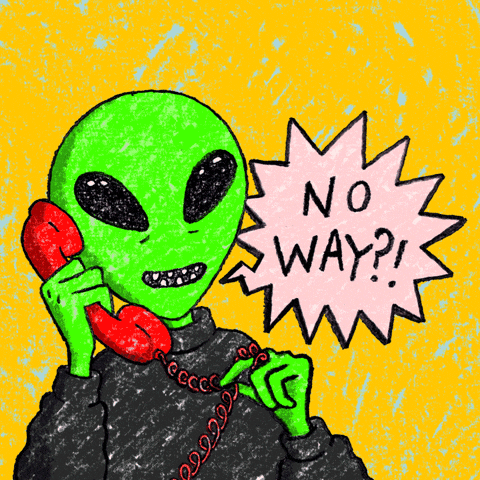

In [15]:
from IPython.display import display

# Process the first frame for demonstration
detected_frame, descriptions = perform_object_detection(frames[0])

# Convert to Image and display
output_image = Image.fromarray(cv2.cvtColor(detected_frame, cv2.COLOR_BGR2RGB))
display(output_image)


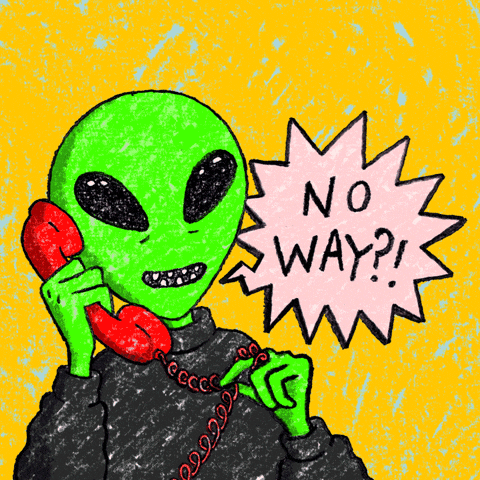

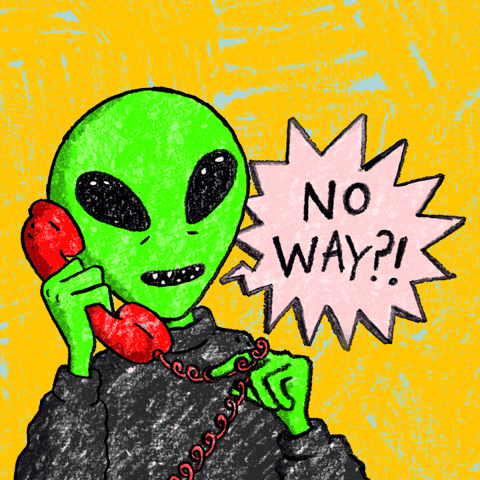

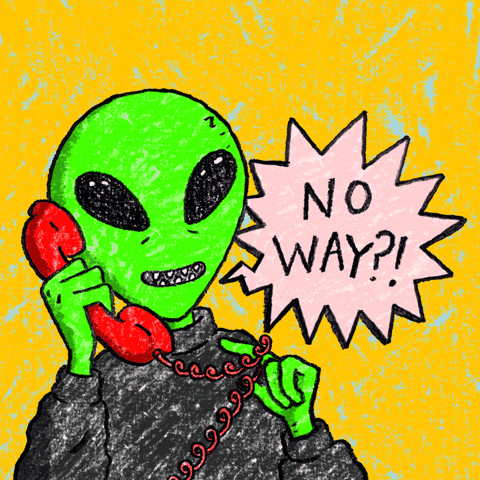

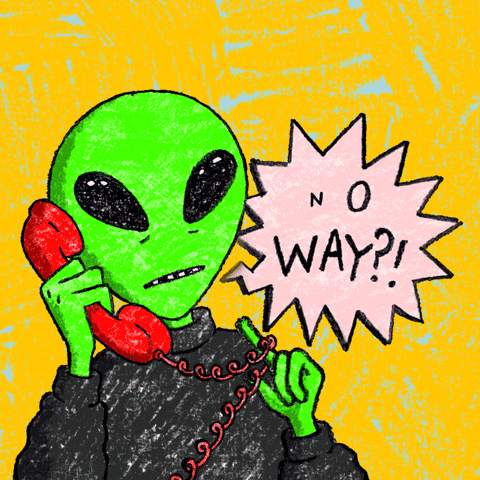

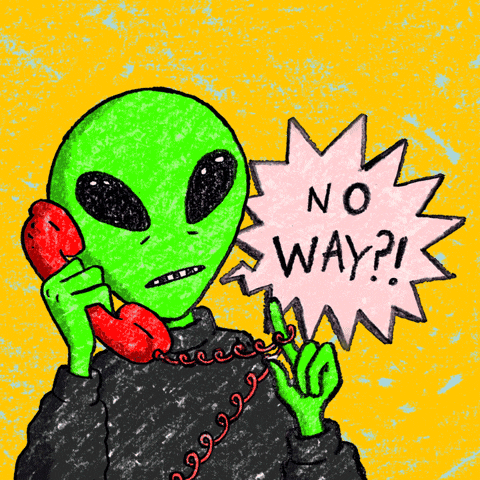

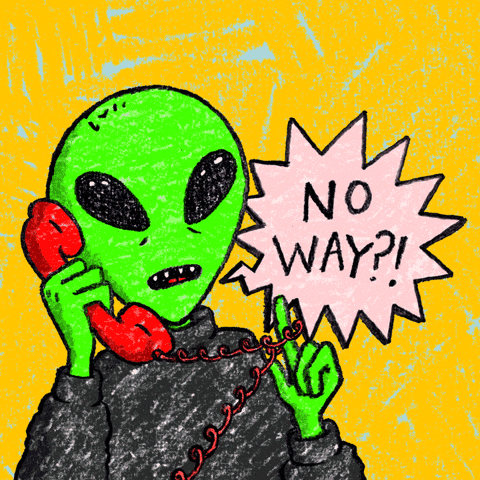

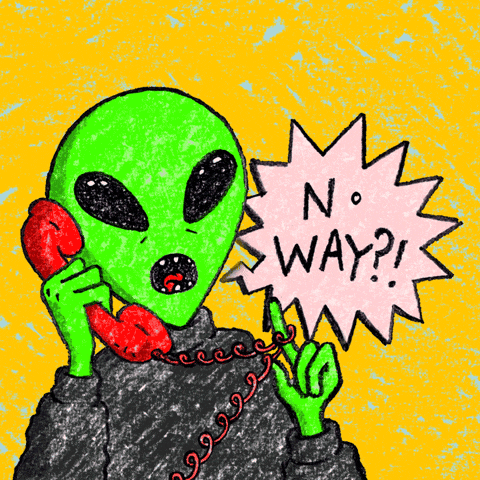

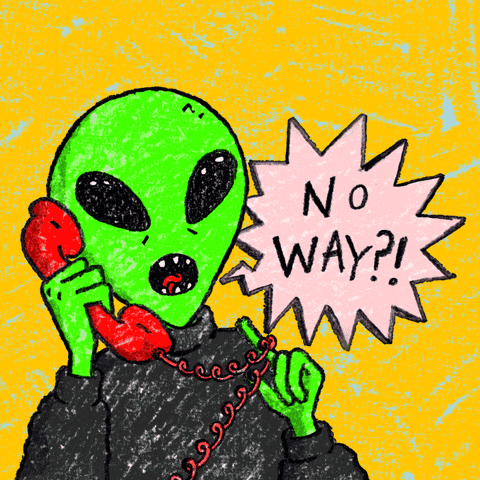

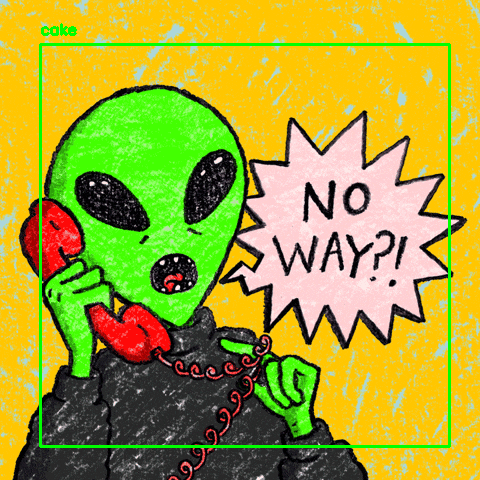

Detected cake at location (40, 44, 409, 402)


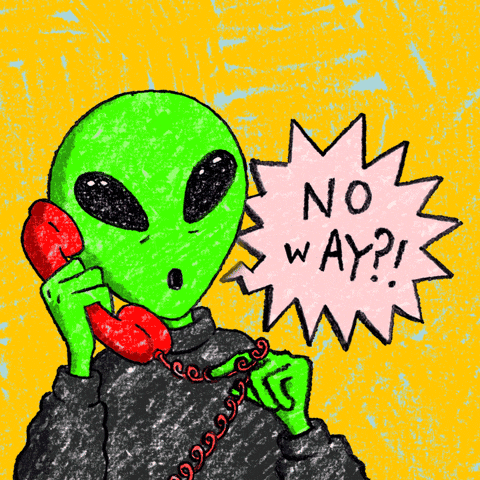

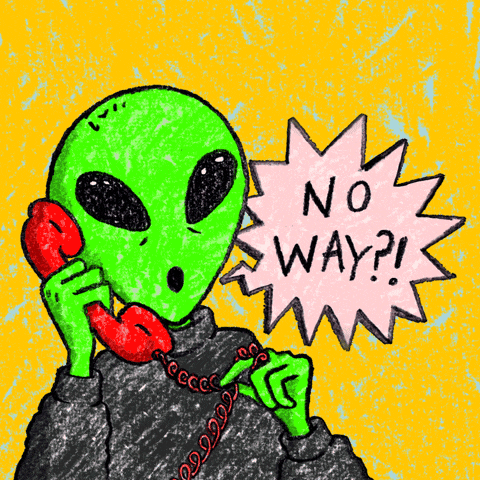

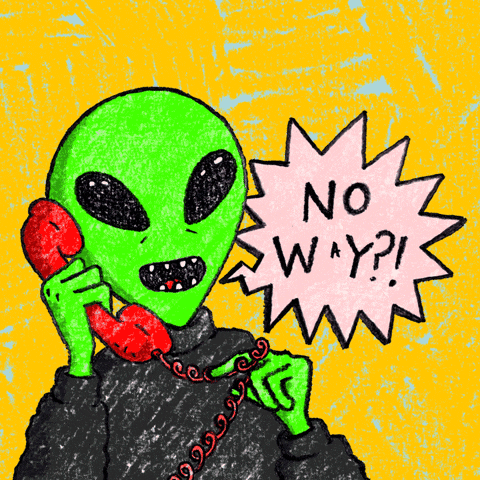

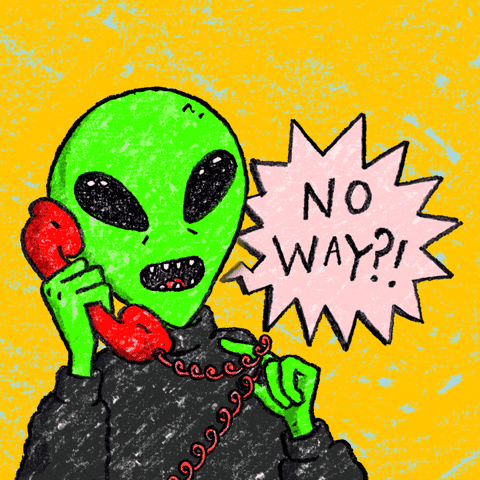

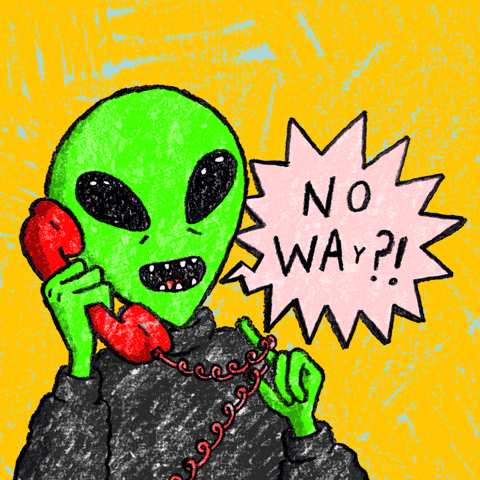

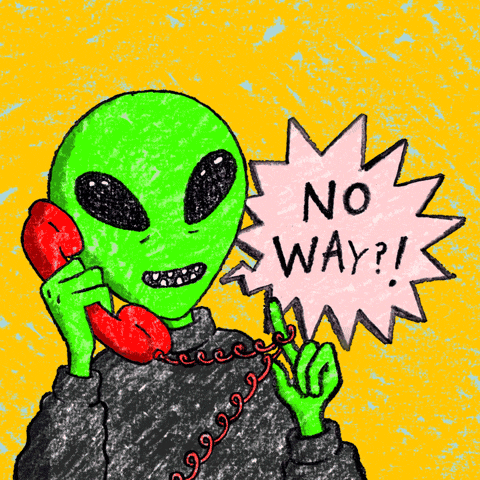

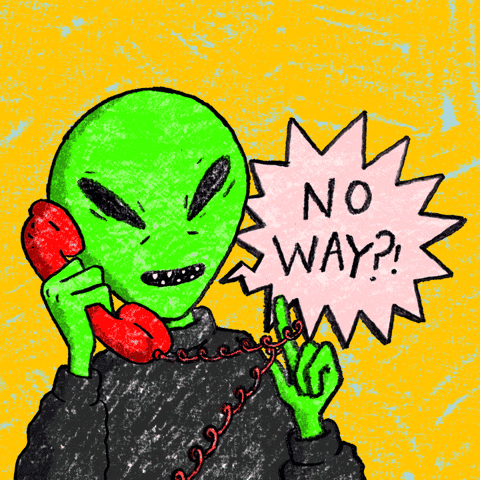

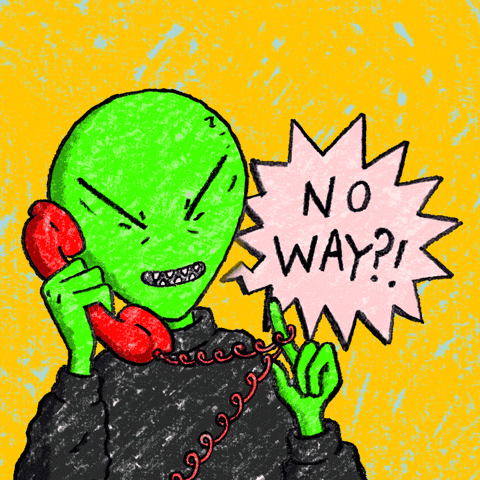

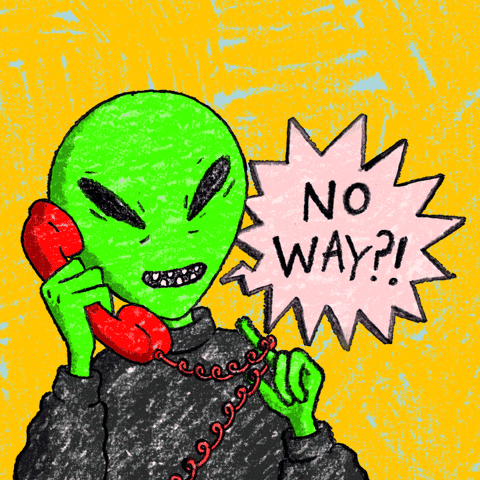

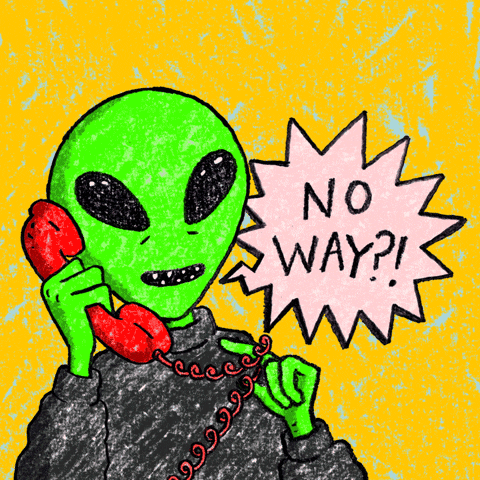

In [16]:
# prompt: object detection

import numpy as np
# Assuming you have already loaded the GIF and extracted frames as 'frames'

def perform_object_detection(frame):
    height, width, channels = frame.shape

    # Create blob from image
    blob = cv2.dnn.blobFromImage(frame, 0.00392, (416, 416), (0, 0, 0), True, crop=False)
    net.setInput(blob)
    outs = net.forward(output_layers)

    # Store detected objects
    class_ids = []
    confidences = []
    boxes = []
    descriptions = []

    for out in outs:
        for detection in out:
            scores = detection[5:]
            class_id = np.argmax(scores)
            confidence = scores[class_id]
            if confidence > 0.5:
                # Object detected
                center_x = int(detection[0] * width)
                center_y = int(detection[1] * height)
                w = int(detection[2] * width)
                h = int(detection[3] * height)
                x = int(center_x - w / 2)
                y = int(center_y - h / 2)
                boxes.append([x, y, w, h])
                confidences.append(float(confidence))
                class_ids.append(class_id)
                descriptions.append(f"Detected {classes[class_id]} at location ({x}, {y}, {w}, {h})")

    # Apply Non-Maximum Suppression
    indexes = cv2.dnn.NMSBoxes(boxes, confidences, 0.5, 0.4)
    for i in range(len(boxes)):
        if i in indexes:
            x, y, w, h = boxes[i]
            label = str(classes[class_ids[i]])
            cv2.rectangle(frame, (x, y), (x + w, y + h), (0, 255, 0), 2)
            cv2.putText(frame, label, (x, y - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)
    return frame, descriptions

# Process each frame in the GIF
for frame in frames:
    detected_frame, descriptions = perform_object_detection(frame)

    # Convert to Image and display (optional)
    output_image = Image.fromarray(cv2.cvtColor(detected_frame, cv2.COLOR_BGR2RGB))
    display(output_image)

    # Print the descriptive output (optional)
    for description in descriptions:
        print(description)